<a href="https://colab.research.google.com/github/ajitkumarkp/ML/blob/master/Pytorch_Kenyan_food_classifier_kaggle.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <font style="color:green">Overview</font>

This is Kaggle project to develop a Kenyan food classifier . The dataset consists of 8,174 images in 13 Kenyan food type classes- https://www.kaggle.com/c/opencv-pytorch

```
# This is formatted as code
```

-dl-course-classification/data. Heres a sample-

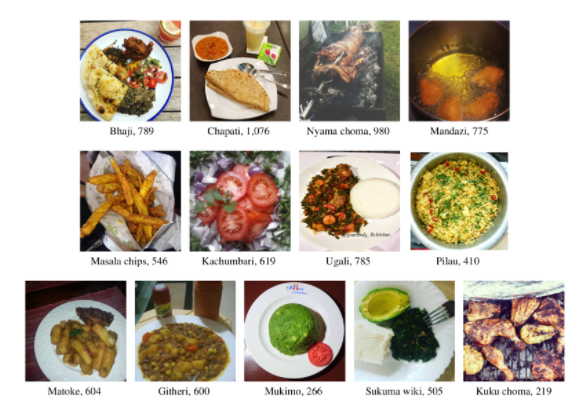



## <font style="color:green">Scoring matrix</font>

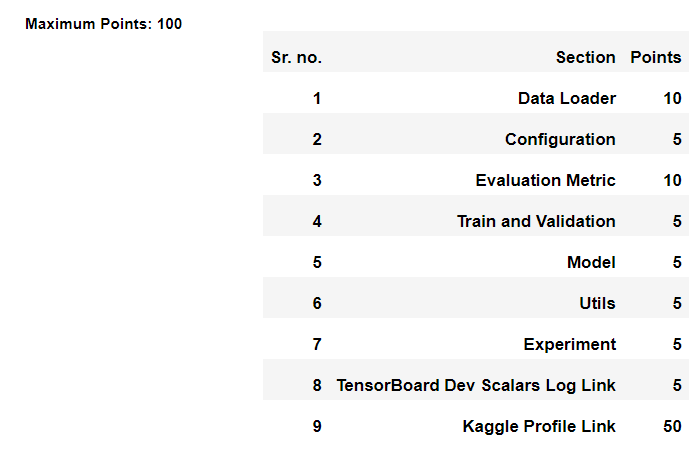

## <font style="color:green">1. Data Loader [10 Points]</font>

In this section, you have to write a class or methods that will be used to get training and validation data
loader.

You will have to write a custom dataset class to load data.

**Note that there are not separate validation data, so you will have to create your validation set by dividing train data into train and validation data. Usually, in practice, we do `80:20` ratio for train and validation, respectively.** 

For example,

```
class KenyanFood13Dataset(Dataset):
    """
    
    """
    
    def __init__(self, *args):
    ....
    ...
    
    def __getitem__(self, idx):
    ...
    ...
    
    
```

```
def get_data(args1, *agrs):
    ....
    ....
    return train_loader, test_loader
```

In [ ]:
pwd

'/content'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/ColabNotebooks/Pytorch/Proj2_kenyan_food

/content/drive/MyDrive/ColabNotebooks/Pytorch/Proj2_kenyan_food




> All neccessary Imports


In [ ]:
%matplotlib inline
# %matplotlib notebook
%load_ext autoreload
%autoreload 2

# Common Python modules
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
import shutil
from PIL import Image
from operator import itemgetter
from dataclasses import dataclass
import itertools

# Pytorch modules
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import functional as F

import torch.nn.functional as SF

from torchvision import datasets, transforms, models
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import MultiStepLR
from torch.utils.tensorboard import SummaryWriter

# Trainer modules
from trainer import Trainer, hooks, configuration
from trainer.utils import setup_system, patch_configs
from trainer.metrics import AccuracyEstimator
from trainer.tensorboard_visualizer import TensorBoardVisualizer

In [ ]:
pwd

'/content/drive/MyDrive/ColabNotebooks/Pytorch/Proj2_kenyan_food'



> split_data() splits the total no of images in ./pytorch-opencv-course-classification/images/images' to 80-20% under  ./kaggle/working/training and ./kaggle/working/validation directories.



In [ ]:
def split_data(data_root, dest_dir, split):
        # get image to class mapping
        label_csv_path = os.path.join(data_root, 'train.csv')
        label_df = pd.read_csv(label_csv_path, delimiter=' *, *', engine='python')
        
        # First column contains the image IDs
        image_arr = np.asarray(label_df.iloc[:, 0])
        # Second column is the Class labels
        label_arr = np.asarray(label_df.iloc[:, 1])

        classes =  np.unique(label_arr)
#         print("self.image_arr:", len(self.image_arr))

        def indices(mylist, value):
            return [i for i,x in enumerate(mylist) if x==value]

        class_img_map = dict()
        
        # Find the indices corresponding to each class 
        # And use those indices to get the image IDs from image_arr
        for clas in classes:
            clas_indices_list = indices(label_arr, clas)
            class_img_map[clas]= [image_arr[i] for i in clas_indices_list]
        
        train_path = os.path.join(dest_dir+"training/")
        if not os.path.exists(train_path):
            os.makedirs(train_path)
            
        val_path = os.path.join(dest_dir+"validation/")
        if not os.path.exists(val_path):
            os.makedirs(val_path)
         
        copied = 0

        for clas in classes:
            train_clas_path = train_path+"{}".format(clas)
            if not os.path.exists(train_clas_path):
                os.makedirs(train_clas_path)
#             print("train_clas_path:", train_clas_path)

            val_clas_path = val_path+"{}".format(clas)
            if not os.path.exists(val_clas_path):
                os.makedirs(val_clas_path)

            total = len(class_img_map[clas])
            train = class_img_map[clas][:int(split*total)]
            val = class_img_map[clas][int(split*total):]
#             print("train:", len(train))
#             print("val:", len(val))
#             print("total:", total)

            for img in train:
                src = data_root+'images/'+'images/'+'{}.jpg'.format(img)
                dst = train_clas_path
                shutil.copy(src,dst)
                copied+=1

            for img in val:
                src = data_root+'images/'+'images/'+'{}.jpg'.format(img)
                dst = val_clas_path
                shutil.copy(src,dst)                
                copied+=1

#         print ("Totallly copied:", copied)
        
        return classes
            

In [ ]:
data_root = './pytorch-opencv-course-classification/'
dest_dir  = './kaggle/working/'
test_root = './Test_Imgs/Test/'

# classes = split_data(data_root,dest_dir, split=0.8)
# print("classes:", classes)


Extract all the test images from test.csv and copy them to ./Test_Imgs/Test/

In [1]:
# Comment below code. Just needs to be done once.
label_csv_path = os.path.join(data_root, 'test.csv')
label_df = pd.read_csv(label_csv_path, delimiter=' *, *', engine='python')
id_arr = np.asarray(label_df.iloc[:, 0])
# print(id_arr)
copied=0
for img in id_arr:
    src = data_root+'images/'+'images/'+'{}.jpg'.format(img)
    dst = test_root
    shutil.copy(src,dst)
    # print("src:",src,"-->","dst:",dst)
    copied+=1
print(copied)

NameError: ignored

Total no of images (Training+Validation+Test) = 8169

In [ ]:
path, dirs, files = next(os.walk("./pytorch-opencv-course-classification/images/images"))
file_count = len(files)
print (file_count)

8169


Total no of Test images = 1638

In [ ]:
path, dirs, files = next(os.walk(test_root))
file_count = len(files)
print("Total images in {}: {}".format(test_root, file_count))
# print (files)


Total images in ./Test_Imgs/Test/: 1638


Total no of Training+Validation images = 6531

In [ ]:
import os
total=0
for path, dirs, files in os.walk(dest_dir):
    # file_count = len(files)
    # print("Files in ", path, len(files))
    total+=len(files)
print("Total:", total)

Total: 6531


In [ ]:
%load_ext tensorboard
# %reload_ext tensorboard
# %tensorboard --logdir=/kaggle/working/logs_food_class

In [ ]:
# rm -rf /kaggle/working/training && rm -rf /kaggle/working/validation

Customer dataset class

In [ ]:
class KenyanFood13Dataset(Dataset):
    """
    This custom dataset class take root directory and train flag, 
    and return dataset training dataset id train flag is true 
    else is return validation dataset.
    """
    
    def __init__(self, data_root, train=True, image_shape=None, transform=None):
        
        """
        init method of the class.
        
         Parameters:
         
         data_root (string): path of root directory.
         
         train (boolean): True for training dataset and False for test dataset.
         
         image_shape (int or tuple or list): [optional] int or tuple or list. Defaut is None. 
                                             It is not None image will resize to the given shape.
                                 
         transform (method): method that will take PIL image and transforms it.
         
        """
        # set image_resize attribute
        if image_shape is not None:
            if isinstance(image_shape, int):
                self.image_shape = (image_shape, image_shape)
            
            elif isinstance(image_shape, tuple) or isinstance(image_shape, list):
                assert len(image_shape) == 1 or len(image_shape) == 2, 'Invalid image_shape tuple size'
                if len(image_shape) == 1:
                    self.image_shape = (image_shape[0], image_shape[0])
                else:
                    self.image_shape = image_shape
            else:
                raise NotImplementedError 
                
        else:
            self.image_shape = image_shape
            
        # set transform attribute
        self.transform = transform   
    
        self.classes= ['bhaji', 'chapati', 'githeri', 'kachumbari', 'kukuchoma', 'mandazi',
                       'masalachips', 'matoke', 'mukimo', 'nyamachoma', 'pilau', 'sukumawiki', 'ugali']
        
        # initialize the data dictionary
        self.data_dict = {
            'image_path': [],
            'label': []
        }
        
        # # training data path, this will be used as data root if train = True
        # if train:
        #     img_dir = os.path.join(data_root, 'training')
        # # validation data path, this will be used as data root if train = False
        # else:
        #     img_dir = os.path.join(data_root, 'validation')
            
        for i, clas in enumerate(self.classes):
            # class_path = os.path.join(img_dir, clas)
            class_path = os.path.join(data_root, clas)
#             print("class_path:",class_path)
            for img in os.listdir(class_path):
                if img.endswith(".jpg") or img.endswith(".png"):
                    img_path = os.path.join(class_path, img)
                    self.data_dict['image_path'].append(img_path)
                    self.data_dict['label'].append(i)
                    
    def __len__(self):
        """
        return length of the dataset
        """
        return len(self.data_dict['label'])
    
    
    def __getitem__(self, idx):
        """
        For given index, return images with resize and preprocessing.
        """
        image = Image.open(self.data_dict['image_path'][idx]).convert("RGB")
        
        if self.image_shape is not None:
            image = F.resize(image, self.image_shape)
            
        if self.transform is not None:
            image = self.transform(image)
            
        target = self.data_dict['label'][idx]
        
        return image, target
    
    
    def food_name(self, label):
        """
        class label to name mapping
        """
        return self.classes[label]
                


Loading Training and Validation dataset:

- There are no transforms here
- image_shape specfies the size

In [ ]:
classes= ['bhaji', 'chapati', 'githeri', 'kachumbari', 'kukuchoma', 'mandazi',
                       'masalachips', 'matoke', 'mukimo', 'nyamachoma', 'pilau', 'sukumawiki', 'ugali']

train_data_root = './kaggle/working/training'
validation_data_root = './kaggle/working/validation'

train_dataset =  KenyanFood13Dataset(train_data_root, train=True, image_shape=256)
print('Length of the training dataset: {}'.format(len(train_dataset)))

val_dataset =  KenyanFood13Dataset(validation_data_root, train=False, image_shape=256)
print('Length of the validation dataset: {}'.format(len(val_dataset)))

print("classes:", classes)


Length of the training dataset: 5220
Length of the validation dataset: 1311
classes: ['bhaji', 'chapati', 'githeri', 'kachumbari', 'kukuchoma', 'mandazi', 'masalachips', 'matoke', 'mukimo', 'nyamachoma', 'pilau', 'sukumawiki', 'ugali']


Label: 0, Food: bhaji


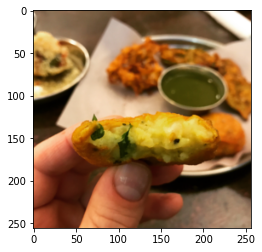

In [ ]:
img, trgt = train_dataset[4]
print('Label: {}, Food: {}'.format(trgt,train_dataset.food_name(trgt)))
plt.imshow(img)
plt.show()

Label: 9, Food: nyamachoma


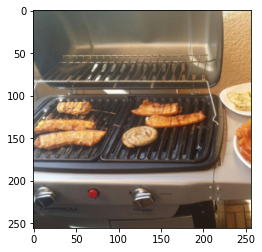

In [ ]:
img, trgt = val_dataset[1009]
print('Label: {}, Food: {}'.format(trgt,train_dataset.food_name(trgt)))
plt.imshow(img)
plt.show()

Using your own Transform i.e preprocess

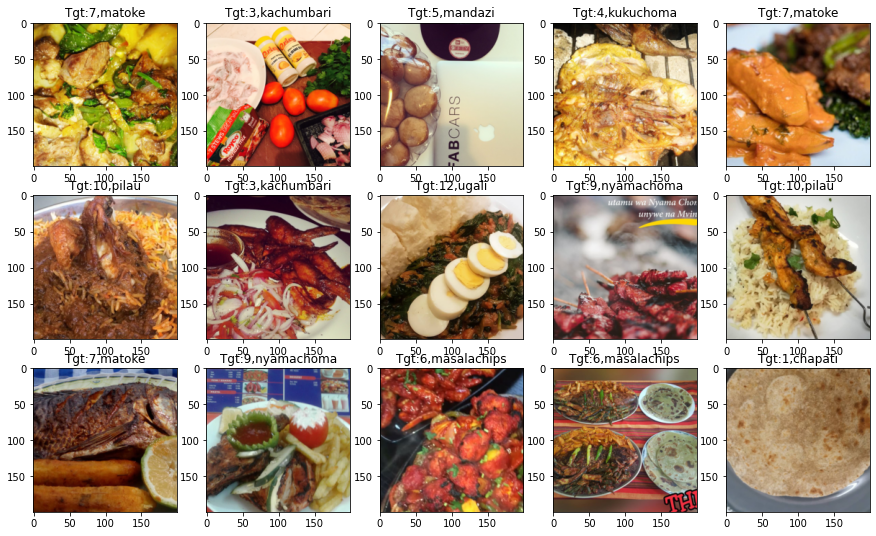

In [ ]:
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(200),
    transforms.ToTensor()
    ])

test_dataset =  KenyanFood13Dataset(train_data_root, train=False, image_shape=None, transform=preprocess)

# dataloader with dataset
test_loader = torch.utils.data.DataLoader(
        test_dataset,
        batch_size=15,
        shuffle=True,
        num_workers=2
    )


# Plot few images
plt.rcParams["figure.figsize"] = (15, 9)
plt.figure
for images, labels in test_loader:
    for i in range(len(labels)):
        plt.subplot(3, 5, i+1)
        img = F.to_pil_image(images[i])
        plt.imshow(img)
        plt.gca().set_title('Tgt:{0},{1}'.format(labels[i], classes[labels[i]]))
    plt.show()
    break

## <font style="color:green">2. Configuration [5 Points]</font>

Define your configuration in this section.

For example,

```
@dataclass
class TrainingConfiguration:
    '''
    Describes configuration of the training process
    '''
    batch_size: int = 10 
    epochs_count: int = 50  
    init_learning_rate: float = 0.1  # initial learning rate for lr scheduler
    log_interval: int = 5  
    test_interval: int = 1  
    data_root: str = "/kaggle/input/pytorch-opencv-course-classification/" 
    num_workers: int = 2  
    device: str = 'cuda'  
    
```

Done in Experiment class.

## <font style="color:green">3. Evaluation Metric [10 Points]</font>

Define methods or classes that will be used in model evaluation, for example, accuracy, f1-score, etc.

Used default Metric i.e Top1 Accuracy in Trainer class.

## <font style="color:green">4. Train and Validation [5 Points]</font>

Write the methods or classes that will be used for training and validation. 

In [ ]:
def image_preprocess_transforms():
    
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor()
        ])
    
    return preprocess

For ImageNet: 

mean = [0.485, 0.456, 0.406] 

std = [0.229, 0.224, 0.225]

In [ ]:
def image_common_transforms(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
    preprocess = image_preprocess_transforms()
    
    common_transforms = transforms.Compose([
        preprocess,
        transforms.Normalize(mean, std)
    ])
    
    return common_transforms
    

In [ ]:
def data_augmentation_preprocess(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
    train_transforms = transforms.Compose([
                transforms.Resize(256),
                transforms.CenterCrop(224),
                transforms.RandomChoice([
                  transforms.RandomHorizontalFlip(),
                  transforms.RandomVerticalFlip(),
                  transforms.RandomAffine(degrees=10, translate=None, scale=None,shear=30, resample=False, fillcolor=2),
                  transforms.RandomGrayscale(p=0.2),
                  transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5),
                  transforms.RandomRotation(20),
                  transforms.RandomCrop(224),
                  ## Below options throws errors
                  # transforms.Pad(8), 
                  # transforms.RandomPerspective(),
                  # transforms.RandomErasing(),
            ]),
                transforms.ToTensor(),
                transforms.Normalize(mean, std)
        ])
    return train_transforms

In [ ]:
def get_mean_std(data_root, num_workers=4):
    
    transform = image_preprocess_transforms()
    
    loader = data_loader(data_root, transform)

    mean = 0.
    std = 0.
    
    for images, _ in loader:
        batch_samples = images.size(0) # batch size (the last batch can have smaller size!)
        images = images.view(batch_samples, images.size(1), -1)
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)

    mean /= len(loader.dataset)
    std /= len(loader.dataset)
    
    print('mean: {}, std: {}'.format(mean, std))
    
    return mean, std

In [ ]:
def data_loader(data_root, transform, train, batch_size=16, shuffle=False, num_workers=2):

    dataset =  KenyanFood13Dataset(data_root, train, image_shape=None, transform=transform)
    
    loader = torch.utils.data.DataLoader(dataset, 
                                         batch_size=batch_size,
                                         num_workers=num_workers,
                                         shuffle=shuffle)
    
    return loader

In [ ]:
def get_data(batch_size, data_root, num_workers=4, data_augmentation=False):
    
    train_data_path = os.path.join(data_root, 'training')
       
    # mean, std = get_mean_std(data_root=train_data_path, num_workers=num_workers)
    # mean = torch.tensor([0.485, 0.456, 0.406])  #[0.5784, 0.4630, 0.3461])
    # std =  torch.tensor([0.229, 0.224, 0.225])  #[0.2376, 0.2461, 0.2467])
    # common_transforms = image_common_transforms(mean, std)

    common_transforms = image_common_transforms()
        
    # if data_augmentation is true 
    if data_augmentation:    
        train_transforms = data_augmentation_preprocess()
    # else do common transforms
    else:
        train_transforms = common_transforms
      
        
    # train dataloader
    
    train_loader = data_loader(train_data_path,
                               train_transforms, 
                               train=True, 
                               batch_size=batch_size, 
                               shuffle=True, 
                               num_workers=num_workers)
    
    # test dataloader
    
    test_data_path = os.path.join(data_root, 'validation')
    
    test_loader = data_loader(test_data_path,
                              common_transforms, 
                              train=False, 
                              batch_size=batch_size, 
                              shuffle=False, 
                              num_workers=num_workers)
    
    return train_loader, test_loader

## <font style="color:green">5. Model [5 Points]</font>

Define your model in this section.

**You are allowed to use any pre-trained model.**

In [ ]:
def pretrained_resnext50_32x4d(transfer_learning=True, retrain_8_9_10=False, num_class=13):
    
    resnext50_32x4d = models.resnext50_32x4d(pretrained=True) # by default load the imagenet weights
    
    if transfer_learning and not retrain_8_9_10: # All layers are frozen except the last FC layer
      for param in resnext50_32x4d.parameters():
          param.requires_grad = False

    if retrain_8_9_10: # Retrain layers 8-9-10
      layer = 0
      for child in resnext50_32x4d.children():
        layer += 1
        if layer < 7:
          for param in child.parameters():
            param.requires_grad = False

    last_layer_in = resnext50_32x4d.fc.in_features
    resnext50_32x4d.fc = nn.Linear(last_layer_in, num_class)
    
    # for param in resnext50_32x4d.parameters():
    #   print(param.requires_grad)

    return resnext50_32x4d

In [ ]:
resnet = pretrained_resnext50_32x4d(transfer_learning=False, retrain_8_9_10=True)
# print(resnet)

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth


## <font style="color:green">6. Utils [5 Points]</font>

Define your methods or classes which are not covered in the above sections.

In [ ]:
class myTensorBoardVisualizer(TensorBoardVisualizer):
  def __init__(self):
        self._writer = SummaryWriter("./runs/retrain_getdatafixed")

## <font style="color:green">7. Experiment [5 Points]</font>

Choose your optimizer and LR-scheduler and use the above methods and classes to train your model.

In [ ]:
class Experiment:
    def __init__(
        self,
        system_config: configuration.SystemConfig = configuration.SystemConfig(),
        dataset_config: configuration.DatasetConfig = configuration.DatasetConfig(),
        dataloader_config: configuration.DataloaderConfig = configuration.DataloaderConfig(),
        optimizer_config: configuration.OptimizerConfig = configuration.OptimizerConfig()
    ):
        self.loader_train, self.loader_test = get_data(
            batch_size=dataloader_config.batch_size,
            num_workers=dataloader_config.num_workers,
            data_root=dataset_config.root_dir,
            data_augmentation = True
        )

        self.model = resnet
        self.loss_fn = nn.CrossEntropyLoss()
        self.metric_fn = AccuracyEstimator(topk=(1, ))
        self.optimizer = optim.SGD(
            self.model.parameters(),
            lr=optimizer_config.learning_rate,
            # weight_decay=optimizer_config.weight_decay,
            momentum=optimizer_config.momentum
        )
        # self.optimizer = optim.Adam(
        #       self.model.parameters(),
        #       lr = optimizer_config.learning_rate,
        # )
        self.lr_scheduler = MultiStepLR(
            self.optimizer, milestones=optimizer_config.lr_step_milestones, gamma=optimizer_config.lr_gamma
        )
        self.visualizer = myTensorBoardVisualizer() # Writer will output to ./runs/ directory by default
        setup_system(system_config)

    def run(self, trainer_config: configuration.TrainerConfig) -> dict:

        device = torch.device(trainer_config.device)
        self.model = self.model.to(device)
        self.loss_fn = self.loss_fn.to(device)

        model_trainer = Trainer(
            model=self.model,
            loader_train=self.loader_train,
            loader_test=self.loader_test,
            loss_fn=self.loss_fn,
            metric_fn=self.metric_fn,
            optimizer=self.optimizer,
            lr_scheduler=self.lr_scheduler,
            device=device,
            data_getter=itemgetter(0),
            target_getter=itemgetter(1),
            stage_progress=trainer_config.progress_bar,
            get_key_metric=itemgetter("top1"),
            visualizer=self.visualizer,
            model_saving_frequency=trainer_config.model_saving_frequency,
            save_dir=trainer_config.model_dir
        )

        model_trainer.register_hook("end_epoch", hooks.end_epoch_hook_classification)
        self.metrics = model_trainer.fit(trainer_config.epoch_num)
        return self.metrics




In [ ]:
def main():
    '''Run the experiment
    '''
    # patch configs depending on cuda availability
    dataloader_config, trainer_config = patch_configs(epoch_num_to_set=50)
    dataset_config = configuration.DatasetConfig(root_dir=data_root)
    experiment = Experiment(dataset_config=dataset_config, dataloader_config=dataloader_config)
    # results = experiment.run(trainer_config)

    # return results

In [ ]:
if __name__ == '__main__':
    main()

## <font style="color:green">8. TensorBoard Dev Scalars Log Link [5 Points]</font>

Share your tensorboard scalars logs link in this section. You can also share (not mandatory) your GitHub link if you have pushed this project in GitHub. 

For example, [Find Project2 logs here](https://tensorboard.dev/experiment/kMJ4YU0wSNG0IkjrluQ5Dg/#scalars).

https://tensorboard.dev/experiment/ErhVHQA7SgyVhEIghgZl6g/#scalars

In [ ]:
# %load_ext tensorboard
# %reload_ext tensorboard
!tensorboard dev upload --logdir ./runs --name "Kenyan Food Classifier" --description "Testing"

In [ ]:
# %load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir=./runs

<IPython.core.display.Javascript object>

In [ ]:
# tensorboard --logdir logs_fashion_mnist --port default

## <font style="color:green">9. Kaggle Profile Link [50 Points]</font>

Share your Kaggle profile link here with us so that we can give points for the competition score. 

You should have a minimum accuracy of `75%` on the test data to get all points. If accuracy is less than `70%`, you will not get any points for the section. 

**You must have to submit `submission.csv` (prediction for images in `test.csv`) in `Submit Predictions` tab in Kaggle to get any evaluation in this section.**

https://www.kaggle.com/ajitkphx/

Following sections contains the code for Test image Predictions, Confusion Matrix etc 

#  <font style="color:green">10. Test Image Predictions </font>


In [ ]:
def prediction(model, device, batch_input):
    
    # send model to cpu/cuda according to your system configuration
    model.to(device)
    
    # it is important to do model.eval() before prediction
    model.eval()

    data = batch_input.to(device)

    output = model(data)

    # Score to probability using softmax
    prob = SF.softmax(output, dim=1)

    # get the max probability
    pred_prob = prob.data.max(dim=1)[0]
    
    # get the index of the max probability
    pred_index = prob.data.max(dim=1)[1]
    
    return pred_index.cpu().numpy(), pred_prob.cpu().numpy()

In [ ]:
def get_sample_prediction(model, data_root, mean, std):
    batch_size = 15

    if torch.cuda.is_available():
        device = "cuda"
        num_workers = 8
    else:
        device = "cpu"
        num_workers = 2
    
    # transformed data
    test_dataset_trans = datasets.ImageFolder(root=data_root, transform=image_common_transforms(mean, std))
    
    # original image dataset
    test_dataset = datasets.ImageFolder(root=data_root, transform=image_preprocess_transforms())
    
    data_len = test_dataset.__len__()
    # print ("data_len:", data_len)
    
    interval = int(data_len/batch_size)
    
    imgs = []
    inputs = []
    targets = []
    for i in range(batch_size):
        index = i * interval
        trans_input, target = test_dataset_trans.__getitem__(index)
        img, _ = test_dataset.__getitem__(index)
        
        imgs.append(img)
        inputs.append(trans_input)
        targets.append(target)
        
    inputs = torch.stack(inputs)
        
    cls, prob = prediction(model, device, batch_input=inputs)
    
    plt.style.use('default')
    plt.rcParams["figure.figsize"] = (15, 9)
    fig = plt.figure()
    
    
    for i, target in enumerate(targets):
        plt.subplot(3, 5, i+1)
        img = transforms.functional.to_pil_image(imgs[i])
        plt.imshow(img)
        plt.gca().set_title('P:{0}({1:.2}), T:{2}'.format(test_dataset.classes[cls[i]], 
                                                     prob[i], 
                                                     test_dataset.classes[targets[i]]))
    fig.savefig('sample_prediction.png')
    plt.show()
    
    return
    

In [ ]:
def get_full_prediction(model, data_root, mean, std):
    batch_size = 15

    if torch.cuda.is_available():
        device = "cuda"
        num_workers = 8
    else:
        device = "cpu"
        num_workers = 2
                   
    # transformed data
    test_dataset_trans = datasets.ImageFolder(root=data_root, transform=image_common_transforms(mean, std))
    
    # original image dataset
    test_dataset = datasets.ImageFolder(root=data_root, transform=image_preprocess_transforms())
    
    data_len = test_dataset.__len__()
    # print ("data_len:", data_len)
    
    interval = int(data_len/batch_size)
    
    imgs = []
    inputs = []
    targets = []
    for i in range(data_len):
        index = i #* interval
        trans_input, target = test_dataset_trans.__getitem__(index)
        img, _ = test_dataset.__getitem__(index)
        
        imgs.append(img)
        inputs.append(trans_input)
        targets.append(target)
        
    inputs = torch.stack(inputs)

    classes = []  
    probs = []  
    for i in range(0, data_len, batch_size):
        batch_ip= inputs[i:i+batch_size]
        cls, prob = prediction(model, device, batch_input=batch_ip)
        classes.append(cls)
        probs.append(prob)

    return targets, probs, classes
        
    

# 11 . Load Model

In [ ]:
def load_model(model, model_dir='checkpoints', model_file_name='model2020-08-20 22_46_38.652290'): 
# def load_model(model, model_dir='checkpoints', model_file_name='model2020-08-30 03:51:43.111804'):
  
    model_path = os.path.join(model_dir, model_file_name)

    # loading the model and getting model parameters by using load_state_dict
    model.load_state_dict(torch.load(model_path))
    
    return model

In [ ]:
m = load_model(resnet)

test_data_path = os.path.join(data_root, 'validation')

train_data_path = os.path.join(data_root, 'training')

# mean, std = get_mean_std(train_data_path)

In [ ]:
mean = torch.tensor([0.485, 0.456, 0.406])
std =  torch.tensor([0.229, 0.224, 0.225])
print(mean, std)

tensor([0.4850, 0.4560, 0.4060]) tensor([0.2290, 0.2240, 0.2250])


In [ ]:
# get_sample_prediction(m, test_data_path, mean, std)
# targets, probs, classes = get_full_prediction(m, test_data_path, mean, std)

# import itertools
# y_prob = list(itertools.chain.from_iterable(probs))
# y_pred = list(itertools.chain.from_iterable(classes))

# y_target = np.asarray(targets)
# y_predicted = np.asarray(y_pred)

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Reds):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')



Confusion matrix, without normalization
[[ 94   9   0   1   0   4   3   4   3   2   7   0   0]
 [  6 148   1   2   0   4   2   2   0   0   3   1   4]
 [  0   4  87   2   0   0   0   2   0   1   0   0   0]
 [  6   5   1  61   0   0   1   4   1   5   2   2  11]
 [  2   0   1   3  10   1   2   1   0  14   0   0   1]
 [  5   2   0   1   1 112   2   0   0   1   0   0   0]
 [  2   1   1   2   1   0  79   0   0   1   1   0   0]
 [  3   1   1   2   1   2   2  77   0   2   0   2   4]
 [  3   2   0   2   1   0   0   1  31   1   1   0   1]
 [  0   1   2   8   5   0   3   0   2 130   1   3   1]
 [  2   1   0   7   1   0   0   3   0   0  50   1   1]
 [  0   1   3   1   0   1   0   2   0   2   0  49  22]
 [  2   0   3   9   0   0   1   1   1   3   0  20  86]]


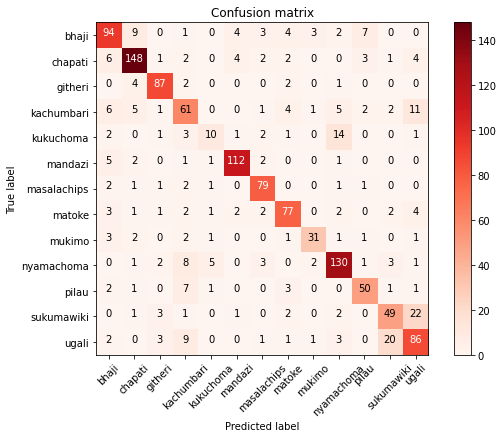

In [ ]:
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_target, y_predicted)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(8, 6))
plot_confusion_matrix(cnf_matrix, classes= ['bhaji', 'chapati', 'githeri', 'kachumbari', 'kukuchoma', 'mandazi','masalachips', 'matoke', 'mukimo', 'nyamachoma', 'pilau', 'sukumawiki', 'ugali'])
plt.show()

In [ ]:
ls

checkpoints/                           runs/                  trainer/
kaggle/                                sample_prediction.png
pytorch-opencv-course-classification/  Test_Imgs/


In [ ]:
class KenyanFood13Testset(Dataset):

    def __init__(self, data_root, image_shape=None, transform=None):
      
      self.image_shape = image_shape
          
      # set transform attribute
      self.transform = transform   
  
      self.data_dict = {
          'image_path': []
      }
      
      for img in os.listdir(data_root):
        img_path = os.path.join(data_root, img)
        self.data_dict['image_path'].append(img_path)
            
    def __len__(self):
      return len(self.data_dict['image_path'])
  
    
    def __getitem__(self, idx):

      image = Image.open(self.data_dict['image_path'][idx]).convert("RGB")
      
      if self.image_shape is not None:
          image = F.resize(image, self.image_shape)
          
      if self.transform is not None:
          image = self.transform(image)
      
      return image
  

In [ ]:
test_data = KenyanFood13Testset("./Test_Imgs/Test", image_shape=None, transform = image_preprocess_transforms()) #data_root, image_shape=None, transform=None

In [ ]:
# test_data.transform
test_img_path=[]
for each in test_data.data_dict['image_path']:
  test_img_path.append(each.strip())
print(len(test_img_path))
print(test_img_path)

1638
['./Test_Imgs/Test/1255838052347703913.jpg', './Test_Imgs/Test/3128569738018489091.jpg', './Test_Imgs/Test/13206921344428048576.jpg', './Test_Imgs/Test/14821606558201435649.jpg', './Test_Imgs/Test/11169730427123105877.jpg', './Test_Imgs/Test/6935090551980744441.jpg', './Test_Imgs/Test/2075669848385099186.jpg', './Test_Imgs/Test/3396833193198700680.jpg', './Test_Imgs/Test/7903645926835307909.jpg', './Test_Imgs/Test/8131343961915104980.jpg', './Test_Imgs/Test/5572067514111382278.jpg', './Test_Imgs/Test/18130385372494771245.jpg', './Test_Imgs/Test/16014255725798508949.jpg', './Test_Imgs/Test/17678401718186637352.jpg', './Test_Imgs/Test/8464218233091680668.jpg', './Test_Imgs/Test/13198348573316800472.jpg', './Test_Imgs/Test/10619929827387197798.jpg', './Test_Imgs/Test/4483848793587466732.jpg', './Test_Imgs/Test/14646216953902787580.jpg', './Test_Imgs/Test/14885818782999856641.jpg', './Test_Imgs/Test/2763233031761903091.jpg', './Test_Imgs/Test/14433107744050567709.jpg', './Test_Imgs/Te

image size: (1080, 1080)


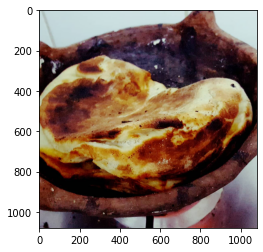

In [ ]:
img = test_data[5]
print('image size: {}'.format(img.size))
plt.imshow(img)
plt.show()

In [ ]:
def get_test_predictions(model, data_root):
    batch_size = 14

    if torch.cuda.is_available():
        device = "cuda"
        num_workers = 8
    else:
        device = "cpu"
        num_workers = 2
                   
    # transformed data
    test_dataset_trans = KenyanFood13Testset(data_root, transform=image_common_transforms()) 
    
    # original image dataset
    test_dataset = KenyanFood13Testset(data_root, transform=image_preprocess_transforms()) 
    
    data_len = test_dataset.__len__()
    print ("data_len:", data_len)

    imgs = []
    inputs = []
    # data_len = 28
    for index in range(data_len):
      try:
        trans_img = test_dataset_trans.__getitem__(index)
        img = test_dataset.__getitem__(index)
        imgs.append(img)
        inputs.append(trans_img)
      except Exception as ex:
        print("index:",index)
        print(ex)
        pass

    inputs = torch.stack(inputs)

    preds = []  
    probs = []  
    for i in range(0, data_len, batch_size):
        batch_ip= inputs[i:i+batch_size]
        pred, prob = prediction(model, device, batch_input=batch_ip)
        preds.append(pred)
        probs.append(prob)
   
    return imgs, probs, preds

In [ ]:
m = load_model(resnet)
test_root="./Test_Imgs/Test"

imgs, probs, preds = get_test_predictions(m, test_root)

print("Batch pred:",len(preds))


data_len: 1638
Batch pred: 117


since Batch size=14, 117x14 = 1638

# predicted: 1638


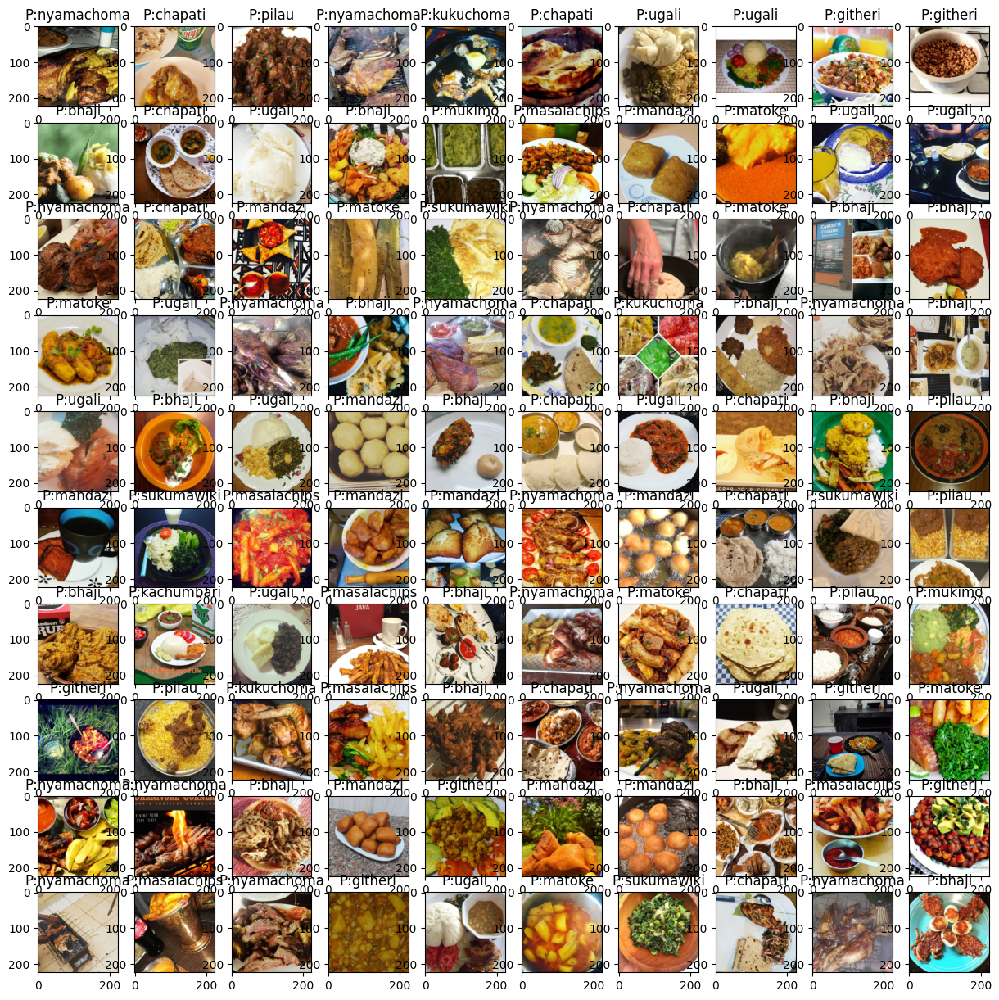

In [ ]:
classes= ['bhaji', 'chapati', 'githeri', 'kachumbari', 'kukuchoma', 'mandazi','masalachips', 'matoke', 'mukimo', 'nyamachoma', 'pilau', 'sukumawiki', 'ugali']

y_pred = list(itertools.chain.from_iterable(preds))
y_predicted = np.asarray(y_pred)
print("# predicted:", len(y_predicted))

plt.style.use('default')
plt.rcParams["figure.figsize"] = (15, 15)
fig = plt.figure()

subset = 100
for i in range(subset):
    plt.subplot(10, subset/10, i+1)
    img = transforms.functional.to_pil_image(imgs[i])
    plt.imshow(img)
    plt.gca().set_title('P:{0}'.format(classes[y_predicted[i]]))
    
plt.show()

In [ ]:
output = [classes[i] for i in y_predicted]
print(len(output))


1638


In [ ]:
path, dirs, files = next(os.walk(test_root))
file_count = len(files)
print("Total images in {}: {}".format(test_root, file_count))
image_arr=[]
for file in files:
  image_arr.append(file.strip()[:-4])

print(image_arr)

Total images in ./Test_Imgs/Test: 1638
['1255838052347703913', '3128569738018489091', '13206921344428048576', '14821606558201435649', '11169730427123105877', '6935090551980744441', '2075669848385099186', '3396833193198700680', '7903645926835307909', '8131343961915104980', '5572067514111382278', '18130385372494771245', '16014255725798508949', '17678401718186637352', '8464218233091680668', '13198348573316800472', '10619929827387197798', '4483848793587466732', '14646216953902787580', '14885818782999856641', '2763233031761903091', '14433107744050567709', '929547668789122424', '2224981444106704933', '18426943923391956361', '12675696889000557268', '15791703871751245807', '10519153448070663082', '7110786576969486032', '15662555471234479295', '2041918257774488258', '7798119164090028747', '16863679609295193704', '5217401552568716653', '8900485242932497652', '15010872175872627302', '4015243674580015337', '14329999749436931016', '2299237642879591215', '5677145000661758740', '3626183809635328010',

In [ ]:
# test_data.transform
test_img_path=[]
for each in test_data.data_dict['image_path']:
  test_img_path.append(each.strip())
print(len(test_img_path))
print(test_img_path)

1638
['./Test_Imgs/Test/1255838052347703913.jpg', './Test_Imgs/Test/3128569738018489091.jpg', './Test_Imgs/Test/13206921344428048576.jpg', './Test_Imgs/Test/14821606558201435649.jpg', './Test_Imgs/Test/11169730427123105877.jpg', './Test_Imgs/Test/6935090551980744441.jpg', './Test_Imgs/Test/2075669848385099186.jpg', './Test_Imgs/Test/3396833193198700680.jpg', './Test_Imgs/Test/7903645926835307909.jpg', './Test_Imgs/Test/8131343961915104980.jpg', './Test_Imgs/Test/5572067514111382278.jpg', './Test_Imgs/Test/18130385372494771245.jpg', './Test_Imgs/Test/16014255725798508949.jpg', './Test_Imgs/Test/17678401718186637352.jpg', './Test_Imgs/Test/8464218233091680668.jpg', './Test_Imgs/Test/13198348573316800472.jpg', './Test_Imgs/Test/10619929827387197798.jpg', './Test_Imgs/Test/4483848793587466732.jpg', './Test_Imgs/Test/14646216953902787580.jpg', './Test_Imgs/Test/14885818782999856641.jpg', './Test_Imgs/Test/2763233031761903091.jpg', './Test_Imgs/Test/14433107744050567709.jpg', './Test_Imgs/Te

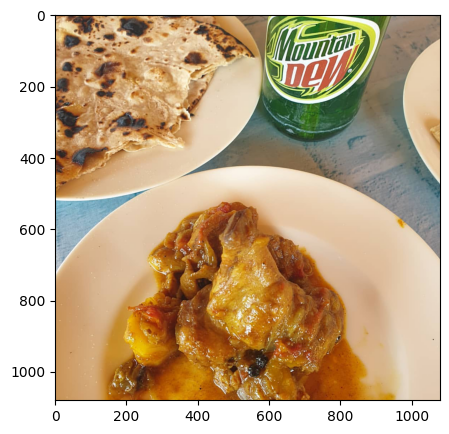

In [ ]:
for img in os.listdir("./Test_Imgs/Test/"):
  if img == "3128569738018489091.jpg":
      image = Image.open("./Test_Imgs/Test/"+ img).convert("RGB")
      plt.rcParams["figure.figsize"] = (5, 5)
      plt.imshow(image)
      plt.show()
      break

In [ ]:
csv = {"id": image_arr, "class":output}
df = pd.DataFrame(csv) 
  
# saving the dataframe 
df.to_csv('mysubmission3.csv', index=False) 